In [2]:
%matplotlib inline
import sys
sys.path.append('/home/rogupta/wikinet_2/')

import numpy as np
import matplotlib.pyplot as plt
import pickle
import spacy
from fuzzywuzzy import fuzz
import re
from collections import defaultdict

from src.utils.utils import *
from src.utils.data import *
from src.conll.pershina import PershinaExamples

In [21]:
yamada_model = pickle_load(join('/work/rogupta/wikinet_data', 'yamada', 'yamada_model.pickle'))

ent_dict = yamada_model['ent_dict']
rev_ent = reverse_dict(ent_dict)
redirects = pickle_load('/work/rogupta/wikinet_data/redirects.pickle')

In [4]:
pershina = PershinaExamples('/work/rogupta/wikinet_data/', yamada_model)
train, dev, test = pershina.get_training_examples()

cand_lens = []
for split in [train, dev, test]:
    for word_arr, examples in split:
        for mention, cands in examples:
            cand_lens.append(len(cands))
            
cand_lens = np.array(cand_lens)
mean, std = np.mean(cand_lens), np.std(cand_lens)

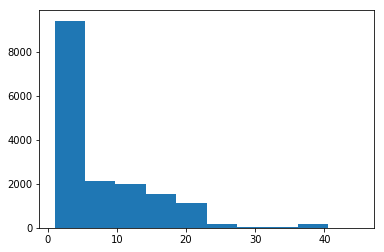

In [9]:
plt.hist(cand_lens)
plt.show()

## Disamb

In [75]:
RE_TITLE = re.compile(r'.*resource\/(.*)\> .*ontology.*')
RE_DISAMB = re.compile(r'.*resource\/(.*)\> .')
dis_dict = defaultdict(list)
with open('/work/rogupta/wiki_data/disambiguations_en.ttl', 'r') as f:
    for i, line in enumerate(f):
        if i==0:
            continue
        title = RE_TITLE.match(line.strip())
        disamb = RE_DISAMB.match(line.strip())
        
        if title and disamb and 'disambiguation' not in disamb.group(1):
            dis_dict[title.group(1)].append(disamb.group(1))
            
for k, v in dis_dict.items():
    dis_dict[k] = list(set(v))

In [208]:
for i, (k, v) in enumerate(dis_dict.items()):
    if i == 5:
        break
    print(k, v, '\n')

Alien ['Alien_(Tankard_album)', 'Alien_(shipping_company)', 'Alien_(Third_Day_song)', 'Aliens_(Kaypro_video_game)', 'Aliens_(Tappan_Wright_novel)', 'Alien_(film)', 'The_Aliens_(Australian_band)', 'ATLiens', 'Alien_(franchise)', 'Alien_Sun', 'AliEn_(ALICE_Environment)', 'Aliens_(comic_book)', 'The_Aliens_(TV_series)', 'Aliens_(soundtrack)', 'Alien_(law)', 'Alien_(1984_video_game)', 'Aliens_(film)', 'Alien_Technology', 'Alien_(creature_in_Alien_franchise)', 'Alien_(Britney_Spears_song)', 'The_Alien_(2016_film)', 'Alien_(literary_concept)', 'The_Alien_(film)', 'Aliens_(novel_series)', 'List_of_Alien_and_Predator_games', 'Alien_(band)', 'Alien_(soundtrack)', 'The_Aliens_(Scottish_band)', 'Alien_(software)', 'Alien_(Pennywise_song)', 'Alien_(Strapping_Young_Lad_album)', 'The_Alien_(Animorphs)'] 

Austin_(disambiguation) ['Austin_Island', 'Austin,_Colorado', 'Austin,_Indiana', 'Austin_County,_Texas', 'Austin,_Ontario', 'Austin,_Oregon', 'Austin_College', 'Austin,_Manitoba', 'Austin_Township,

## New cand gen

In [231]:
def coref(examples, thresh=50):
    id2c = {}
    
    # For each example
    for orig_mention_idx, (orig_mention, cands) in enumerate(examples):
        new = True
        
        # Loop over all existing clusters
        for c_id, other_mentions in id2c.items():
            add =  False
            # Loop over all mentions in current cluster
            for other_mention, other_mention_idx in other_mentions:
                orig_mention_lower = orig_mention.lower()
                other_mention_lower = other_mention.lower()
                score = fuzz.ratio(orig_mention_lower, other_mention_lower)
                
                # Got a match
                if score > thresh:
                    add = True
                    break
                    
            # If there is a match, add to cluster       
            if add:
                id2c[c_id].append((orig_mention, orig_mention_idx))
                new = False
                break

        if new:
            id2c[len(id2c)] = [(orig_mention, orig_mention_idx)]
        
    expanded_forms = [0 for _ in range(len(examples))]
    for c_id, cluster in id2c.items():
        expand = ''
        for form, ex_id in cluster:
            if len(form) > len(expand):
                expand = form
        for _, ex_id in cluster:
            expanded_forms[ex_id] = expand
    
    return expanded_forms

In [232]:
for i, (_, examples) in enumerate(dev):
    orig = [ex[0] for ex in examples]
    corefed = coref(examples, 60)
    if i == 1:
        break
    for o, c in zip(orig, corefed):
        print(o, c)
    print()

LEICESTERSHIRE LEICESTERSHIRE
LONDON LONDON
West Indian West Indian
Phil Simmons Phil Simmons
Leicestershire LEICESTERSHIRE
Somerset Somerset
Essex Essex
Derbyshire Warwickshire
Surrey Surrey
Kent Kent
Nottinghamshire Nottinghamshire
Grace Road Grace Road
England England
Andy Caddick Andy Caddick
Nasser Hussain Nasser Hussain
Yorkshire Warwickshire
Headingley Headingley
Oval Oval
Chris Lewis Chris Lewis
Warwickshire Warwickshire
Mark Butcher Mark Butcher
Worcestershire LEICESTERSHIRE
Australian Australian
Tom Moody Tom Moody
Chris Adams Chris Lewis
Paul Johnson Paul Johnson



In [238]:
for split_type, split in zip(['train', 'dev'], [train, dev]):
    for threshold in range(0, 110, 10):
        num_covered = 0
        num_missed = 0
        for _, examples in split:
            expanded_forms = coref(examples, thresh=threshold)

            for ex_idx, ex in enumerate(examples):
                my_cands = []
                dis_cands = []
                mention, pershina_cands = ex
                correct = pershina_cands[0]
                correct = redirects.get(correct, correct)

                # Disamb
                mention_title = mention.title().replace(' ', '_')
                my_cands.append(mention_title)
                mention_disamb = mention_title + '_(disambiguation)'

                if mention_title in dis_dict:
                    dis_cands = dis_dict[mention_title]
                if mention_disamb in dis_dict:
                    dis_cands = dis_dict[mention_disamb]

                for cand in dis_cands:
                    if cand in ent_dict:
                        my_cands.append(cand)

                # Redirects
                if mention_title in redirects:
                    my_cands.append(redirects[mention_title])

                # Coref
                expanded_form = expanded_forms[ex_idx]
                if expanded_form in ent_dict:
                    my_cands.append(redirects.get(expanded_form, expanded_form))

                if correct in my_cands:
                    num_covered += 1
                else:
                    num_missed += 1
                    print(my_cands)
                    print(pershina_cands)
                    print()

        total = num_covered + num_missed
        print(f'Threshold : {threshold}, Split : {split_type}, Num Covered : {num_covered} ({num_covered / total}), Num Missed : {num_missed}({num_missed / total})')
    print()

['British', 'British_Isles', 'British_English', 'Britishness', 'British_people', 'Terminology_of_the_British_Isles']
['United_Kingdom', 'British_English', 'British_Empire', 'British_Isles', 'British_people', 'British_Raj', 'British_undergraduate_degree_classification', 'British_India_(band)', 'British_Islands', 'British_Figure_Skating_Championships', 'British_Airways_Flight_9', 'British_baseball', 'British_Band', 'British_Formula_Three_Championship', 'Lord_British', 'Presidencies_and_provinces_of_British_India', 'British_humour']

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain']
['United_Kingdom', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Little_Britain,_London', 'Captain_Britain', 'New_Communist_Party_of_Britain', 'Roman_Britain', 'Little_Britain', 'Great_Britain', 'Little_Britain,_Ontario', 'Kingdom_of_Great_Britain']

['Bse', 'BSE']
['Bovine_spongiform_encephalopathy']

['Span

['Psv_Eindhoven']
['PSV_Eindhoven', 'PSV_Eindhoven_(Superleague_Formula_team)']

['Anderlecht']
['R.S.C._Anderlecht', 'Anderlecht']

['Lokeren']
['K.S.C._Lokeren_Oost-Vlaanderen', 'Lokeren']

['Mouscron']
['R.E._Mouscron', 'Mouscron']

['Antwerp', 'Antwerp_(province)', 'Port_of_Antwerp', 'Antwerp,_Ohio', 'Antwerp_(district)', 'Antwerp']
['Royal_Antwerp_F.C.', 'Antwerp_International_Airport', 'Antwerp,_New_York', 'Antwerp_Six', 'Antwerp_(district)', 'Antwerp', 'Antwerp,_Ohio', 'University_of_Antwerp', 'Antwerp_school', 'Antwerp_(province)']

['Lommel', 'Ulli_Lommel', 'Lommel']
['K.F.C._Lommel_S.K.', 'Lommel']

['Ghent', 'Ghent', 'Ghent,_Kentucky', 'Ghent_(Norfolk)', 'Treaty_of_Ghent', 'Ghent,_West_Virginia', 'Ghent,_New_York']
['K.A.A._Gent', 'Ghent_Altarpiece', 'Ghent,_Kentucky', 'Ghent', 'Ghent_University', 'Ghent,_New_York', 'Ghent_(Norfolk)', 'Ghent,_West_Virginia']

['Aalst', 'Aalst,_Belgium', 'Aalst,_North_Brabant']
['SC_Eendracht_Aalst', 'Aalst,_North_Brabant', 'Arrondissement_of


['Namibia']
['Namibia_national_football_team', 'University_of_Namibia', 'Namibia']

['Botswana']
['Botswana_national_football_team', 'Botswana', 'Botswana_pula', 'University_of_Botswana']

['Seychelles']
['Seychelles_national_football_team', 'Seychelles', 'Seychelles_International_Airport', 'University_of_Seychelles']

['Mauritius', 'Mauritius_(Commonwealth_realm)', 'Mauritius']
['Mauritius_national_football_team', 'Mauritius_(Commonwealth_realm)', 'British_Mauritius', 'University_of_Mauritius', 'Mauritius']

['Togo', 'Togo,_Saskatchewan', 'Togo', 'Dick_Togo', 'Jonathan_Togo', 'TOGO']
['Togo_national_football_team', 'Togo', 'Togo,_Minnesota', 'Lake_Togo', 'TOGO', 'Tōgō,_Kagoshima', 'Togo_Mountains', 'Tōgō,_Tottori', 'Togo,_Saskatchewan']

['Congo', 'Congo_Basin', 'Belgian_Congo', 'Congo_(BBC_TV_series)', 'Kid_Congo_Powers', 'Congo_River', 'French_Congo', 'Democratic_Republic_of_the_Congo', 'Congo_Crisis', 'The_Congos', "People's_Republic_of_the_Congo", 'Republic_of_the_Congo_(Léopoldv

['Sri_Lanka_national_cricket_team', 'University_of_Sri_Lanka', 'Sri_Lanka', 'Sri_Lankan_Civil_War']

['India', 'India_Arie', 'Names_of_India', 'India', 'Greater_India', 'Indian_subcontinent', 'Dominion_of_India', 'La_India']
['India_national_cricket_team', 'India_Longford', 'India', 'British_Indian', 'Greater_India', 'Names_of_India', 'Mongol_invasions_of_India', 'Indian_Health_Service', 'Communist_Party_of_India', 'La_India', 'Indian_Science_Congress_Association']

['India', 'India_Arie', 'Names_of_India', 'India', 'Greater_India', 'Indian_subcontinent', 'Dominion_of_India', 'La_India']
['India_national_cricket_team', 'India_Longford', 'British_Indian', 'Greater_India', 'Names_of_India', 'Mongol_invasions_of_India', 'Indian_Health_Service', 'India', 'Communist_Party_of_India', 'La_India', 'Indian_Science_Congress_Association']

['Sri_Lanka']
['Sri_Lanka_national_cricket_team', 'University_of_Sri_Lanka', 'Sri_Lanka', 'Sri_Lankan_Civil_War']

['India', 'India_Arie', 'Names_of_India', 'I

['Royal_Free_Hospital_School_Of_Medicine']
['Royal_Free_Hospital']

['University_Hospital', 'Teaching_hospital']
['Uppsala_University_Hospital', 'National_University_Hospital']

['Cbi']
['Confederation_of_British_Industry', 'CBI_(film_series)']

['Confederation_Of_British_Industry']
['Confederation_of_British_Industry']

['Greek', 'Greek_to_me', 'Greek_language', 'Modern_Greek', 'Ancient_Greek', 'Koine_Greek', 'Greek_(TV_series)', 'Greek_alphabet', 'Greek_Orthodox_Church', 'Proto-Greek_language', 'Greek_Revival_architecture', 'Greek_love', 'Names_of_the_Greeks', 'Greeks_(finance)', 'Medieval_Greek', 'Greek_Theatre_(Los_Angeles)', 'Greeks']
['Greece', 'Greek_Dark_Ages', 'Greek_mythology', 'Greek_Theatre_(Los_Angeles)', 'Greek_Street', 'Greeks_(finance)', 'Greek_language', 'Greek_sea_gods', 'Greek_Cypriots', 'Greek_alphabet', 'Greeks', 'Greek_mathematics', 'Names_of_the_Greeks', 'The_Greek', 'Greek_numerals', 'Ancient_Greek', 'Koine_Greek']

['British', 'British_Isles', 'British_English'


['Dutch', 'Dutch_Schultz', 'Dutch_language', 'Dutch_Defence', 'Dutch_people', 'Dutch_angle', 'Dutch_Mantel', 'Dutch_TT', 'Dutch_Grand_Prix', 'Pennsylvania_Dutch']
['Netherlands', 'Dutch_auction', 'Dutch_East_Indies', 'Dutch_Brazil', 'Dutch_Clark', 'Dutch_language', 'Dutch_Defence', 'Dutch_School_(painting)', 'Dutch_cuisine', 'Old_Dutch', 'Dutch_oven', 'Dutch_European_Constitution_referendum,_2005', 'Dutch_people', 'Dutch_India', 'Dutch_elm_disease', 'Dutch_Reformed_Church', 'Dutch_East_India_Company', 'Dutch_nationality_law']

['Dutch', 'Dutch_Schultz', 'Dutch_language', 'Dutch_Defence', 'Dutch_people', 'Dutch_angle', 'Dutch_Mantel', 'Dutch_TT', 'Dutch_Grand_Prix', 'Pennsylvania_Dutch']
['Netherlands', 'Dutch_auction', 'Dutch_East_Indies', 'Dutch_Brazil', 'Dutch_Clark', 'Dutch_language', 'Dutch_Defence', 'Dutch_School_(painting)', 'Dutch_cuisine', 'Old_Dutch', 'Dutch_oven', 'Dutch_European_Constitution_referendum,_2005', 'Dutch_people', 'Dutch_India', 'Dutch_elm_disease', 'Dutch_Refor

['Club_Universidad_Nacional']

['Neza', 'Ciudad_Nezahualcóyotl']
['Toros_Neza', 'Ciudad_Nezahualcóyotl']

['Brazilian_Football_Confederation']
['Brazil', 'Brazilian_Football_Confederation']

['Russia', 'Russia,_New_York', 'Russian_Soviet_Federative_Socialist_Republic', 'Great_Russia', 'Russian_Republic', 'Russian_Empire', 'Little_Russia', 'White_Russia', 'Tsardom_of_Russia', 'Russia', 'Central_Russia']
['Russia_national_football_team', 'Russia,_New_York', 'Russian_Chess_Championship', 'Russia-K', 'Russia', 'Russia_and_weapons_of_mass_destruction', 'LGBT_rights_in_Russia', 'European_Russia', 'Russian_Empire', 'Russian_Air_Force', '1998_Russian_financial_crisis', 'Geography_of_Russia', 'Great_Russia', 'Russia-1', 'Little_Russia']

['Cbf']
['Brazilian_Football_Confederation', 'CBF-FM']

['Jean', 'Jeans', 'Jean_(song)', 'Jean_Grey', 'Jean_Valjean', 'Jean,_Nevada']
['Jean-Baptiste_Colbert', 'Prince_Jean,_Duke_of_Guise', 'Jean,_Cardinal_of_Lorraine', 'Jean-Baptiste-Siméon_Chardin', 'Jean-Jac

['Miami_Marlins', 'Florida_Province', 'French_Florida', 'Florida,_Valle_del_Cauca', 'Florida,_Orange_County,_New_York', 'Florida,_Puerto_Rico', 'Florida,_Uruguay', 'USS_Florida_(BB-30)', 'Florida,_Massachusetts', 'Florida_State_Capitol', 'Florida,_Buenos_Aires', 'Florida_Panthers', 'Florida,_Gauteng', 'Florida_election_recount', 'Florida,_Cuba', 'La_Florida,_Chile', 'Florida', 'Florida,_Montgomery_County,_New_York', 'Florida,_Missouri', 'Windermere,_Florida']

['Philadelphia', 'Center_City,_Philadelphia', 'USS_Philadelphia_(C-4)', 'USS_Philadelphia_(1799)', 'Philadelphia_County,_Pennsylvania', 'Philadelphian_cricket_team', 'Philadelphia_chromosome', 'Philadelphia_(magazine)', 'Philadelphians', 'Philadelphia_(film)', 'Philadelphia,_Tyne_and_Wear', 'Philadelphia', 'Philadelphia,_Mississippi']
['Philadelphia_Phillies', 'Philadelphia,_New_York', 'Philadelphia,_Missouri', 'Philadelphia_Association', 'Philadelphia,_Here_I_Come!', 'Philadelphia_County,_Pennsylvania', 'Philadelphia', 'USS_Phil

['Australians']
['Australia_national_cricket_team', 'Australia', 'Australians', 'First_Australians']

['Australia', 'Australia_(2008_film)', 'Australia_II', 'Australia', 'Australia_(horse)', 'Australasia', 'Australia_(continent)', 'Australia_(yacht)']
['Australia_national_cricket_team', 'Australia_Party', 'Australia_Station', 'Australia_(continent)', 'Australia', 'Wittenoom,_Western_Australia', 'Internet_censorship_in_Australia', 'Australia_II', 'Geography_of_Australia', 'Australia_Group', 'Australia_national_rugby_union_team', 'Republicanism_in_Australia']

['India', 'India_Arie', 'Names_of_India', 'India', 'Greater_India', 'Indian_subcontinent', 'Dominion_of_India', 'La_India']
['India_national_cricket_team', 'India_Longford', 'India', 'British_Indian', 'Greater_India', 'Names_of_India', 'Mongol_invasions_of_India', 'Indian_Health_Service', 'Communist_Party_of_India', 'La_India', 'Indian_Science_Congress_Association']

['Zimbabwe', 'Zimbabwe', 'Great_Zimbabwe']
['Zimbabwe_national_cr

['United_Kingdom', 'Little_Britain,_London', 'Captain_Britain', 'New_Communist_Party_of_Britain', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Little_Britain,_Ontario', 'Little_Britain', 'Roman_Britain']

['Rwandan', 'Rwandan_genocide']
['Rwanda']

['Scottish', 'Scottish_Gaelic', 'Scottish_national_identity', 'Scottish_people']
['Scotland', 'Scottish_Division', 'Scottish_English', 'Scottish_Natural_Heritage', 'Scottish_hip-hop', 'Scottish_people', 'Scottish_regiment', 'Scottish_College,_Douai', 'Scottish_Fold', 'Scottish_clan', 'Scottish_Opera', 'Scottish_Party']

['British', 'British_Isles', 'British_English', 'Britishness', 'British_people', 'Terminology_of_the_British_Isles']
['United_Kingdom', 'British_Formula_Three_Championship', 'British_Figure_Skating_Championships', 'British_Raj', 'British_undergraduate_degree_classification', 'British_India_(band)', 'British_Islands', 'British_Isles', 'British_people', 'British_humour', 'British_

['Australia', 'Australia_(2008_film)', 'Australia_II', 'Australia', 'Australia_(horse)', 'Australasia', 'Australia_(continent)', 'Australia_(yacht)']
['Australia_national_cricket_team', 'Geography_of_Australia', 'Australia_Party', 'Australia_Station', 'Internet_censorship_in_Australia', 'Australia_II', 'Republicanism_in_Australia', 'Wittenoom,_Western_Australia', 'Australia_national_rugby_union_team', 'Australia', 'Australia_Group', 'Australia_(continent)']

['Zimbabwe', 'Zimbabwe', 'Great_Zimbabwe']
['Zimbabwe_national_cricket_team', 'University_of_Zimbabwe', 'Great_Zimbabwe', 'Zimbabwe', 'Hyperinflation_in_Zimbabwe', 'Kingdom_of_Zimbabwe']

['Zimbabwe', 'Zimbabwe', 'Great_Zimbabwe']
['Zimbabwe_national_cricket_team', 'University_of_Zimbabwe', 'Great_Zimbabwe', 'Hyperinflation_in_Zimbabwe', 'Zimbabwe', 'Kingdom_of_Zimbabwe']

['Australia', 'Australia_(2008_film)', 'Australia_II', 'Australia', 'Australia_(horse)', 'Australasia', 'Australia_(continent)', 'Australia_(yacht)']
['Australia

['Brazilian', 'Brazilian_cuisine', 'Brazilian_Portuguese', 'Brazilians']
['Brazil', 'Italian_Brazilian']

['Vale_Do_Rio_Doce']
['Vale_(mining_company)']

['British', 'British_Isles', 'British_English', 'Britishness', 'British_people', 'Terminology_of_the_British_Isles', 'Amsterdam']
['United_Kingdom', 'British_Islands', 'British_Empire', 'British_undergraduate_degree_classification', 'British_India_(band)', 'British_Formula_Three_Championship', 'British_people', 'British_Airways_Flight_9', 'British_humour', 'British_English', 'British_Figure_Skating_Championships', 'British_Raj', 'British_Isles', 'British_baseball', 'British_Band', 'Lord_British', 'Presidencies_and_provinces_of_British_India']

['West_Bank', 'West_Bank']
['Palestinian_territories', 'Israeli_West_Bank_barrier', 'Jordanian_occupation_of_the_West_Bank', 'West_Bank']

['Palestinians']
['State_of_Palestine']

['Israeli', 'Israelites', 'Israelis', 'Israelis']
['Israel', 'Israeli_military_decorations', 'Israeli_West_Bank_barr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['Seattle_Mariners', 'Seattle_Center', 'Chief_Seattle', 'Seattle_Opera', 'Seattle', 'Seattle_University', 'Seattle,_Lake_Shore_and_Eastern_Railway']

['Texas', 'Somewhere_Down_in_Texas', 'Alexis_Texas', 'Texas_(TV_series)', 'Republic_of_Texas', 'University_of_Texas_at_Austin', 'Texas', 'Texas,_Queensland', 'Texas_State_Highway_6', 'T._Texas_Tyler', 'Texas_Battle', 'Texas_City,_Texas', 'Texas_(band)', 'Texas']
['Texas_Rangers_(baseball)', 'Texas_Association', 'Texas_County,_Oklahoma', 'Texas_(band)', 'Texas_Longhorns', 'Texas_Township,_Wayne_County,_Pennsylvania', 'Texas_Stadium', 'Texas_District_(LCMS)', 'Texas_Road', 'USS_Texas_(BB-35)', 'The_Texas_Chainsaw_Massacre_(franchise)', 'Texas,_Queensland', 'Texas_Revolution', 'Texas_Motor_Speedway', 'Texas_College', 'Wind_power_in_Texas', 'Texas_Longhorns_football', 'Texas', 'Texas_Tower_(lighthouse)']

['Cleveland', 'Mount_Cleveland_(Montana)', 'Carol_Cleveland', 'Cleveland_Brown', 'Cleveland,_Texas', 'Grover_Cleveland', 'Cleveland,_Utah',

['Nac', 'NAC']
['NAC_Breda', 'NAC_Architecture']

['Danish', 'Danish_language', 'Danish_cuisine', 'Danish_pastry', 'Danish']
['Denmark', 'Danish_pastry', 'Danish_language', 'Danish_India', 'Danish_Estonia']

['Psv_Eindhoven']
['PSV_Eindhoven', 'PSV_Eindhoven_(Superleague_Formula_team)']

['Anderlecht']
['R.S.C._Anderlecht', 'Anderlecht']

['Lokeren', 'Lokeren']
['K.S.C._Lokeren_Oost-Vlaanderen', 'Lokeren']

['Mouscron', 'Mouscron']
['R.E._Mouscron', 'Mouscron']

['Antwerp', 'Antwerp_(province)', 'Port_of_Antwerp', 'Antwerp,_Ohio', 'Antwerp_(district)', 'Antwerp']
['Royal_Antwerp_F.C.', 'Antwerp_International_Airport', 'Antwerp,_New_York', 'Antwerp_Six', 'Antwerp_(district)', 'Antwerp', 'Antwerp,_Ohio', 'University_of_Antwerp', 'Antwerp_school', 'Antwerp_(province)']

['Lommel', 'Ulli_Lommel', 'Lommel', 'Lokeren']
['K.F.C._Lommel_S.K.', 'Lommel']

['Ghent', 'Ghent', 'Ghent,_Kentucky', 'Ghent_(Norfolk)', 'Treaty_of_Ghent', 'Ghent,_West_Virginia', 'Ghent,_New_York', 'Ghent']
['K.A.A._Gent

['U.S._Open']
['US_Open_(tennis)', 'U.S._Open_(swimming)', 'U.S._Open_Badminton_Championships', 'U.S._Open_(golf)', 'U.S._Open_(bowling)', 'U.S._Open']

['Flushing_Meadows', 'Flushing_Meadows–Corona_Park']
['USTA_Billie_Jean_King_National_Tennis_Center', 'Flushing_Meadows–Corona_Park']

['Arantxa_Sanchez_Vicario', 'Arantxa_Sánchez_Vicario']
['Arantxa_Parra_Santonja', 'Arantxa_Sánchez_Vicario']

['Japanese', 'Japanese_people', 'Japanese_language', 'Foreign-born_Japanese', 'Japanese_writing_system', 'Japanese_studies', 'Japanese_cuisine', 'Japanese_diaspora']
['Japan', 'Japanese_Wikipedia', 'Japanese_domestic_market', 'Japanese_castle', 'Japanese_language', 'Half_Japanese', 'Japanese_rice', 'Japanese_cuisine', 'Japanese_architecture', 'Japanese_people', 'Japanese_New_Year', 'Japanese_mathematics', 'Japanese_asset_price_bubble', 'Old_Japanese']

['Brenda_Schultz-Mccarthy']
['Brenda_Schultz-McCarthy']

['Austrian', 'Austrian_literature', 'Austrians', 'Austrian_Airlines', 'Austrian_German',


['Pakistan', 'Dominion_of_Pakistan', 'West_Pakistan', 'East_Pakistan', 'Pakistan', 'Pakistan_International_Airlines', 'Pakistan']
['Pakistan_national_cricket_team', 'Nuclear_power_in_Pakistan', 'Pakistan_Army', 'Pakistan', 'Pakistan_Movement', 'Geography_of_Pakistan', 'Dominion_of_Pakistan']

['Sri_Lanka']
['Sri_Lanka_national_cricket_team', 'University_of_Sri_Lanka', 'Sri_Lanka', 'Sri_Lankan_Civil_War']

['Mcc']
['Marylebone_Cricket_Club', 'McComb,_Mississippi', 'McCarthyism']

['Red_Star', 'Red_star']
['KK_Crvena_zvezda', 'Red_Star_F.C.', 'Red_star', 'The_Red_Star', 'Red_Star_Records', 'Red_Star_Belgrade']

['Yugoslavia', 'Yugoslavia']
['Serbia', 'Socialist_Federal_Republic_of_Yugoslavia', 'Yugoslavia_national_football_team', 'Kingdom_of_Yugoslavia', 'Yugoslavia']

['Red_Star', 'Red_star']
['KK_Crvena_zvezda', 'Red_Star_F.C.', 'Red_star', 'The_Red_Star', 'Red_Star_Records', 'Red_Star_Belgrade']

['Russia', 'Russia,_New_York', 'Russian_Soviet_Federative_Socialist_Republic', 'Great_Ru

['English', 'English,_Indiana', 'English_people', 'English_language_in_England', 'English_national_identity', 'List_of_dialects_of_the_English_language', 'English_language', 'English_studies']
['England', 'English_language', 'English_Party', 'English_River_(Ontario)', 'English_studies', 'English_Bay_(Vancouver)', 'English_Australia', 'English_Association', 'British_English', 'Old_English', 'English_River_(Iowa)', 'English_people', 'U.S._English_(organization)', 'English_Wikipedia', 'English_Canada', 'English_District_(LCMS)', 'English,_August', 'International_English', 'Old_English_(Ireland)', 'American_English', 'California_English', 'English_Bridge']

['Australian', 'Australian_English', 'The_Australian', 'Australiana', 'Aboriginal_Australians', 'Australians', 'Indigenous_Australians', 'Australians']
['Australia', 'Australian_Conservation_Foundation', 'Australian_Football_League', 'Australian_Broadcasting_Corporation', 'Australian_English', 'The_Australian', 'Australian_Rugby_League'

['New_Zealand', 'HMS_New_Zealand_(1911)', 'New_Zealand', 'Realm_of_New_Zealand', 'Dominion_of_New_Zealand']
['New_Zealand_national_rugby_union_team', 'Electoral_system_of_New_Zealand', 'New_Zealand_general_election,_2008', 'University_of_New_Zealand', 'New_Zealand_national_cricket_team', 'New_Zealand_Division', 'New_Zealand', 'New_Zealand_nationality_law', 'Demographics_of_New_Zealand', 'New_Zealand_Rugby_League', 'New_Zealand_Company', 'New_Zealand_national_football_team', 'New_Zealand_Football', 'New_Zealand_English']

['Springbok', 'Springbok', 'Springbok,_Northern_Cape', 'Springbok_Radio', 'Springbok_colours', 'Springbok']
['South_Africa_national_rugby_union_team', 'Springbok', 'Springbok,_Northern_Cape']

['Northern_Transvaal', 'Limpopo']
['Northerns_cricket_team']

['Malaysian_Open', 'Malaysian_Open_Squash_Championships', 'Malaysian_Open_(tennis)', 'Malaysian_Open_(golf)']
['Malaysia_Open_(badminton)', 'Malaysian_Open_(tennis)', 'Malaysian_Open_(golf)', 'Malaysian_Open_Squash_Cha


['Milwaukee', 'Old_Milwaukee', 'Milwaukee_River', 'Milwaukee', 'University_of_Wisconsin–Milwaukee', 'Episcopal_Diocese_of_Milwaukee', 'Chicago,_Milwaukee,_St._Paul_and_Pacific_Railroad', 'Milwaukee_County,_Wisconsin', 'Milwaukee_(town),_Wisconsin', 'Roman_Catholic_Archdiocese_of_Milwaukee', 'Milwaukee_Panthers', 'Milwaukee']
['Milwaukee_Brewers', 'Old_Milwaukee', 'Milwaukee_Journal_Sentinel', 'Milwaukee_Intermodal_Station', 'Milwaukee_Theatre', 'Chicago,_Milwaukee,_St._Paul_and_Pacific_Railroad', 'Milwaukee_River', 'Milwaukee', 'Milwaukee_(town),_Wisconsin', 'USS_Milwaukee_(CL-5)', 'Milwaukee_County,_Wisconsin']

['Texas', 'Somewhere_Down_in_Texas', 'Alexis_Texas', 'Texas_(TV_series)', 'Republic_of_Texas', 'University_of_Texas_at_Austin', 'Texas', 'Texas,_Queensland', 'Texas_State_Highway_6', 'T._Texas_Tyler', 'Texas_Battle', 'Texas_City,_Texas', 'Texas_(band)', 'Texas']
['Texas_Rangers_(baseball)', 'Texas_Road', 'Texas_Association', 'Wind_power_in_Texas', 'Texas_County,_Oklahoma', 'T

['Iraq', 'Iraqi_cuisine']

['Palestinians', 'Palestinians']
['State_of_Palestine']

['Syrians']
['Syria']

['Saudis']
['Saudi_Arabia']

['British', 'British_Isles', 'British_English', 'Britishness', 'British_people', 'Terminology_of_the_British_Isles']
['United_Kingdom', 'British_Raj', 'British_Islands', 'British_people', 'British_English', 'British_India_(band)', 'British_Formula_Three_Championship', 'British_Isles', 'British_humour', 'British_Figure_Skating_Championships', 'British_Airways_Flight_9', 'British_undergraduate_degree_classification', 'British_Empire', 'British_baseball', 'British_Band', 'Lord_British', 'Presidencies_and_provinces_of_British_India']

['Arc', 'Story_arc', 'ARC_(file_format)', 'Arc_welding', 'ArcInfo', "Prix_de_l'Arc_de_Triomphe", 'Volcanic_arc', 'Arc_(protein)', 'Arc_(Savoie)', 'Arc_of_the_United_States', 'Island_arc', 'Character_arc', 'Arc_(Everything_Everything_album)', 'Electric_arc', 'Sony_Ericsson_Xperia_Arc', 'Arch', 'Les_Arcs', 'Arc_(Provence)', 'Jo

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Britain']
['United_Kingdom', 'Little_Britain', 'Little_Britain,_London', 'Captain_Britain', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Kingdom_of_Great_Britain', 'Great_Britain', 'New_Communist_Party_of_Britain', 'Roman_Britain', 'Little_Britain,_Ontario']

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Britain']
['United_Kingdom', 'New_Communist_Party_of_Britain', 'Roman_Britain', 'Little_Britain,_London', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Great_Britain', 'Little_Britain,_Ontario', 'Little_Britain']

['Jean_Van_De_Velde', 'Van_de_Velde']
['Jean_van_de_Velde_(golfer)', 'Jean_van_de_Velde_(director)']

['Tour_Of_The_Netherlands']
['Ronde_van_Nederland']

['Motorola', 'M

['Palestinian', 'Palestinian_Christians', 'Palestinian_diaspora', 'Palestinian_territories', 'Palestinians_in_Jordan', 'Palestinian_Central_Council', 'Palestinian_National_Authority']
['State_of_Palestine', 'Palestinian_cuisine', 'Palestinian_Arabic']

['Palestinians', 'Palestinians']
['State_of_Palestine']

['Palestinian', 'Palestinian_Christians', 'Palestinian_diaspora', 'Palestinian_territories', 'Palestinians_in_Jordan', 'Palestinian_Central_Council', 'Palestinian_National_Authority', 'Palestinians']
['State_of_Palestine', 'Palestinian_cuisine', 'Palestinian_Arabic']

['Israeli', 'Israelites', 'Israelis', 'Israelis']
['Israel', 'Israeli_military_decorations', 'Israeli_West_Bank_barrier', 'Israelis']

['Ing_Group']
['ING_Group']

['Boeing_Co']
['Boeing']

['Salomon_Brothers_Inc']
['Salomon_Brothers']

['Clinton', 'Baddesley_Clinton', 'Clinton,_Missouri', 'Clinton,_Dutchess_County,_New_York', 'Castle_Clinton', 'Clinton,_Ohio', 'Clinton,_Connecticut', 'Port_Clinton,_Ohio', 'Clinton,_C

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Britain']
['United_Kingdom', 'Little_Britain,_London', 'Captain_Britain', 'Great_Britain', 'New_Communist_Party_of_Britain', 'Kingdom_of_Great_Britain', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Little_Britain', 'Little_Britain,_Ontario', 'Roman_Britain']

['New_Zealand', 'HMS_New_Zealand_(1911)', 'New_Zealand', 'Realm_of_New_Zealand', 'Dominion_of_New_Zealand']
['New_Zealand_national_rugby_union_team', 'Electoral_system_of_New_Zealand', 'New_Zealand_general_election,_2008', 'University_of_New_Zealand', 'New_Zealand_national_cricket_team', 'New_Zealand_Division', 'New_Zealand', 'New_Zealand_nationality_law', 'Demographics_of_New_Zealand', 'New_Zealand_Rugby_League', 'New_Zealand_Company', 'New_Zealand_national_football_team', 'New_Zealand_Football', 'New_Zealand_English']

['Springbok', 'Springbok', 'Springbok,_Northern_Cape', 'Sp

['Italy', 'Italian_beef', 'Italian_language', '2005_Italian_Grand_Prix', 'Italian_Campaign_(World_War_II)', 'Italian_Sign_Language', 'Italian_Village', 'Italian_opera', 'Italians', 'Italian_Market,_Philadelphia', 'Italian_Peninsula', 'Italian_Wikipedia']

['Austrian', 'Austrian_literature', 'Austrians', 'Austrian_Airlines', 'Austrian_German', 'Austrian_Empire', 'Austrian_Service_Abroad', 'Austrian_nationality_law', 'Austrian_cuisine']
['Austria', 'Austrian_Airlines', 'Austrian_Empire', 'Austrian_literature', 'Austrian_School', 'Austrian_business_cycle_theory', 'Austrian_International', 'Austrian_Netherlands', 'Austrians']

['Dutch', 'Dutch_Schultz', 'Dutch_language', 'Dutch_Defence', 'Dutch_people', 'Dutch_angle', 'Dutch_Mantel', 'Dutch_TT', 'Dutch_Grand_Prix', 'Pennsylvania_Dutch', 'Dutch']
['Netherlands', 'Dutch_elm_disease', 'Dutch_auction', 'Dutch_Brazil', 'Dutch_Clark', 'Dutch_Defence', 'Dutch_School_(painting)', 'Dutch_Reformed_Church', 'Dutch_people', 'Dutch_language', 'Dutch_ov

['Zimbabwe', 'Zimbabwe', 'Great_Zimbabwe']
['Zimbabwe_national_cricket_team', 'University_of_Zimbabwe', 'Great_Zimbabwe', 'Hyperinflation_in_Zimbabwe', 'Zimbabwe', 'Kingdom_of_Zimbabwe']

['Australia', 'Australia_(2008_film)', 'Australia_II', 'Australia', 'Australia_(horse)', 'Australasia', 'Australia_(continent)', 'Australia_(yacht)', 'Australia']
['Australia_national_cricket_team', 'Geography_of_Australia', 'Australia_Party', 'Australia_Station', 'Internet_censorship_in_Australia', 'Australia_II', 'Australia', 'Republicanism_in_Australia', 'Wittenoom,_Western_Australia', 'Australia_national_rugby_union_team', 'Australia_Group', 'Australia_(continent)']

['Zimbabwe', 'Zimbabwe', 'Great_Zimbabwe']
['Zimbabwe_national_cricket_team', 'University_of_Zimbabwe', 'Great_Zimbabwe', 'Hyperinflation_in_Zimbabwe', 'Zimbabwe', 'Kingdom_of_Zimbabwe']

['S._Waugh']
['Steve_Waugh']

['A._Campbell']
['Alistair_Campbell_(cricketer)']

['H._Streak']
['Heath_Streak']

['E._Brandes']
['Eddo_Brandes']

['

['Sydney', 'Sydney_Smirke', 'Sydney_Pollack', 'University_of_Sydney', 'Sydney_Kentridge', 'Sydney_Barnes', 'Sydney_Laurence', 'Sydney_Allard', 'Sydney_Penny', 'Sydney_Smith', 'Sydney_Cove', 'Sydney,_Nova_Scotia', 'Sydney_Accord', 'Sydney_Camm', 'Sydney_Lamb', 'Thomas_Townshend,_1st_Viscount_Sydney', 'Electoral_district_of_Sydney', 'Sydney', 'Sydney_Horler', 'Sydney_Newman', 'Sydney_Bristow', 'City_of_Sydney', 'Division_of_Sydney', 'Sydney_Schanberg', 'Sydney_Brenner', 'Sydney_Parade_Avenue', 'Sydney_Silverman', 'Sydney_White', 'Sydney_Grundy', 'Sydney_Heads', 'Sydney_Chaplin', 'Sydney_Parkinson', 'Sydney_Greenstreet', 'Sydney']
['2000_Summer_Olympics', 'Sydney,_Lady_Morgan', 'Sydney_Road,_Melbourne', 'Sydney_International', 'Sydney_Tower', 'Sydney,_Nova_Scotia', 'City_of_Sydney', 'Sydney_Hospital', 'Sydney_FC', 'Sydney_Airport', 'Electoral_district_of_Sydney', 'University_of_Sydney', 'Sydney_River', 'Sydney_School', 'Sydney', 'Sydney_Stadium', 'Sydney_River,_Nova_Scotia']

['Olympics',

['U.S._Open']
['US_Open_(tennis)', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'U.S._Open_(golf)', 'U.S._Open_Badminton_Championships', 'U.S._Open']

['Central_Division', 'Kampala_Central_Division', 'Central_Division,_Fiji', 'Central_Division_(NBA)', 'Central_Division_(NHL)']
['National_League_Central', 'Central_Division_(NBA)', 'Central_Division,_Fiji', 'Central_Division_(OHL)', 'Central_Division_(NHL)']

['Cleveland', 'Mount_Cleveland_(Montana)', 'Carol_Cleveland', 'Cleveland_Brown', 'Cleveland,_Texas', 'Grover_Cleveland', 'Cleveland,_Utah', 'Cleveland,_Manitowoc_County,_Wisconsin', 'Cleveland,_Mississippi', 'Cleveland,_England', 'The_Cleveland_Show', 'Cleveland_(UK_Parliament_constituency)', 'Cleveland_County,_Arkansas', 'Cleveland,_Minnesota', 'Cleveland_National_Forest', 'Cleveland_Amory', 'Duke_of_Cleveland', 'Cleveland', 'Cleveland,_Georgia', 'Cleveland_Lakefront_Station', 'Cleveland_Hills', 'Cleveland_County,_North_Carolina', 'Grover_Cleveland_Alexander', 'Cleveland,_North_C

['Kansas_City', 'Kansas_City_metropolitan_area', 'Kansas_City_standard', 'Kansas_City,_Missouri', 'North_Kansas_City,_Missouri', 'Kansas_City_(film)', 'Kansas_City_(Leiber_and_Stoller_song)', 'Kansas_City,_Kansas', 'Kansas_City_metropolitan_area']
['Kansas_City_Royals', 'Kansas_City_Southern_Railway', 'Kansas_City_metropolitan_area', 'Kansas_City,_Mexico_and_Orient_Railway', 'Kansas_City,_Kansas', 'Kansas_City_International_Airport', 'Kansas_City_Chiefs', 'Kansas_City_Club', 'Kansas_City,_Missouri_Municipal_Government', 'Kansas_City,_Pittsburg_and_Gulf_Railroad', 'Kansas_City_Blues/Cowboys', 'Kansas_City,_Missouri', 'Kansas_City_Township,_Adams_County,_North_Dakota']

['Florida', 'Florida_City,_Florida', 'Florida,_Uruguay', 'Florida,_Orange_County,_New_York', 'Florida,_Missouri', 'Florida,_Valle_del_Cauca', 'Spanish_Florida', 'Florida,_Gauteng', 'Florida_Province', 'Florida', 'Florida,_Puerto_Rico', 'Florida,_Massachusetts', 'Florida,_Montgomery_County,_New_York', 'Florida_Gators', 'St

['Anderlecht', 'Anderlecht']
['R.S.C._Anderlecht', 'Anderlecht']

['Lokeren', 'Lokeren']
['K.S.C._Lokeren_Oost-Vlaanderen', 'Lokeren']

['Mouscron', 'Mouscron']
['R.E._Mouscron', 'Mouscron']

['Antwerp', 'Antwerp_(province)', 'Port_of_Antwerp', 'Antwerp,_Ohio', 'Antwerp_(district)', 'Antwerp', 'Antwerp']
['Royal_Antwerp_F.C.', 'Antwerp_International_Airport', 'Antwerp,_New_York', 'Antwerp_Six', 'Antwerp_(district)', 'Antwerp', 'Antwerp,_Ohio', 'University_of_Antwerp', 'Antwerp_school', 'Antwerp_(province)']

['Lommel', 'Ulli_Lommel', 'Lommel', 'Lommel']
['K.F.C._Lommel_S.K.', 'Lommel']

['Ghent', 'Ghent', 'Ghent,_Kentucky', 'Ghent_(Norfolk)', 'Treaty_of_Ghent', 'Ghent,_West_Virginia', 'Ghent,_New_York', 'Ghent']
['K.A.A._Gent', 'Ghent_Altarpiece', 'Ghent,_Kentucky', 'Ghent', 'Ghent_University', 'Ghent,_New_York', 'Ghent_(Norfolk)', 'Ghent,_West_Virginia']

['Aalst', 'Aalst,_Belgium', 'Aalst,_North_Brabant']
['SC_Eendracht_Aalst', 'Aalst,_North_Brabant', 'Arrondissement_of_Aalst', 'Aals


['Togo', 'Togo,_Saskatchewan', 'Togo', 'Dick_Togo', 'Jonathan_Togo', 'TOGO', 'Togo']
['Togo_national_football_team', 'Togo', 'Togo,_Minnesota', 'Lake_Togo', 'TOGO', 'Tōgō,_Kagoshima', 'Togo_Mountains', 'Tōgō,_Tottori', 'Togo,_Saskatchewan']

['Congo', 'Congo_Basin', 'Belgian_Congo', 'Congo_(BBC_TV_series)', 'Kid_Congo_Powers', 'Congo_River', 'French_Congo', 'Democratic_Republic_of_the_Congo', 'Congo_Crisis', 'The_Congos', "People's_Republic_of_the_Congo", 'Republic_of_the_Congo_(Léopoldville)', 'Republic_of_the_Congo', 'Congo_Free_State']
['Congo_national_football_team', 'Congo_River', 'Second_Congo_War', 'Republic_of_the_Congo', 'Democratic_Republic_of_the_Congo', 'Republic_of_the_Congo_(Léopoldville)', 'Congo_Craton']

['Central_African_Republic']
['Central_African_Republic_national_football_team', 'Central_African_Republic']

['Burundi', 'Burundi']
['Burundi_national_football_team', 'Burundi', 'University_of_Burundi']

['Ukrainian', 'Ukrainians', 'Ukrainian_alphabet', 'Ukrainian_la

["Sweden_men's_national_ice_hockey_team", 'Sweden', 'Sweden,_New_York', 'Sweden_Township,_Potter_County,_Pennsylvania', 'Sweden_national_football_team', 'Union_between_Sweden_and_Norway']

['Germany', 'Germany_(European_Parliament_constituency)', 'Germany_Schulz', 'East_Germany', 'Kingdom_of_Germany', 'Germany_Schaefer', 'Allied-occupied_Germany', 'Germany', 'Nazi_Germany', 'History_of_Germany', 'Germany_Valley', 'West_Germany', 'Germany']
["Germany_men's_national_ice_hockey_team", 'Germany', 'Little_Germany,_Bradford', 'West_Germany', 'Germany_Valley', 'Little_Germany,_Manhattan', 'Kingdom_of_Germany', 'Germany_national_football_team', 'East_Germany']

['Neuchatel_Xamax', 'Neuchâtel_Xamax']
['Neuchâtel', 'Neuchâtel_Xamax']

['French', 'French_nationality_law', 'French_language', 'French_people', 'French_catheter_scale', 'French_kiss', 'French']
['France', 'French_people', 'French_Florida', 'French_Island_(Victoria)', 'French_opera', 'French_River_(Ontario)', 'French_Party', 'French_ar

['Javagal_Srinath']

['A._Jadeja']
['Ajay_Jadeja']

['S._Ganguly']
['Sourav_Ganguly']

['India', 'India_Arie', 'Names_of_India', 'India', 'Greater_India', 'Indian_subcontinent', 'Dominion_of_India', 'La_India']
['India_national_cricket_team', 'India_Longford', 'India', 'British_Indian', 'Greater_India', 'Names_of_India', 'Mongol_invasions_of_India', 'Indian_Health_Service', 'Communist_Party_of_India', 'La_India', 'Indian_Science_Congress_Association']

['Sri_Lanka']
['Sri_Lanka_national_cricket_team', 'University_of_Sri_Lanka', 'Sri_Lankan_Civil_War', 'Sri_Lanka']

['India', 'India_Arie', 'Names_of_India', 'India', 'Greater_India', 'Indian_subcontinent', 'Dominion_of_India', 'La_India']
['India_national_cricket_team', 'India_Longford', 'India', 'British_Indian', 'Greater_India', 'Names_of_India', 'Mongol_invasions_of_India', 'Indian_Health_Service', 'Communist_Party_of_India', 'La_India', 'Indian_Science_Congress_Association']

['Sri_Lanka']
['Sri_Lanka_national_cricket_team', 'Univers


['Palestinian', 'Palestinian_Christians', 'Palestinian_diaspora', 'Palestinian_territories', 'Palestinians_in_Jordan', 'Palestinian_Central_Council', 'Palestinian_National_Authority', 'Palestinians']
['State_of_Palestine', 'Palestinian_cuisine', 'Palestinian_Arabic']

['Russian', 'Russian_dressing', 'Russian_alphabet', 'Russian_cuisine', 'Russians', 'Russian_language', 'Russians_(song)', 'Russians']
['Russia', 'Russian_Museum', 'Russian_dressing', 'Russian_culture', 'Russian_River_(California)', 'Russian_literature', 'Russian_National_Unity', '1993_Russian_constitutional_crisis', 'Russian_opera', 'Russian_Hill,_San_Francisco', 'Russian_ruble', 'Russian_architecture', 'Russian_alphabet', 'Russian_jokes', 'Russian_icons', 'Russian_Wikipedia', 'Russian_orthography', 'Russian_language', 'Russian_Party', 'Russians']

['Sharjah', 'Sharjah']
['University_of_Sharjah', 'Sharjah_International_Airport']

['Russians', 'Russians']
['Russia', 'Russians', 'Russians_in_China']

['Moscow', 'David_Mosc

['FC_St._Pauli', 'St._Pauli']

['Max', 'Max_(software)', 'Sam_&_Max', 'Max_Schneider', 'Maxim_(magazine)', 'Commodore_MAX_Machine', 'Max_Russo', 'Max_&_Ruby', 'Maxillaria', 'Lotto_Max', 'Maxima_and_minima', 'Cinemax', 'Max_Guevara', 'Max_(comics)', 'MAX_(band)', 'MAX_Light_Rail', 'MAX_(Utah_Transit_Authority)', 'Max_Branning', 'Autodesk_3ds_Max', 'Max']
['Max_(dog)', 'MAX_(band)', 'Max_Records', 'Maximum_transmission_unit', 'Max,_Minnesota', 'Max_Planck', 'Max_(software)', 'MAX_Light_Rail']

['Wilmots']
['Marc_Wilmots']

['French', 'French_nationality_law', 'French_language', 'French_people', 'French_catheter_scale', 'French_kiss']
['France', 'Old_French', 'French_opera', 'French_Wikipedia', 'French_Island_(Victoria)', 'French_people', 'French_River_(Ontario)', 'French_Party', 'French_Valley', 'French_Louisiana', 'French_River_(Massachusetts)', 'French_language', 'French_Canada', 'French_Community', 'French_Hill', 'French_Montana', 'French_architecture', 'Mount_French_(Queensland)', 'F

['Heinrich_Heine', 'Heinrich_Himmler']

['Cologne', 'Cologne,_Minnesota', 'Eau_de_Cologne', 'Cologne', 'Ford_Cologne_V6_engine', 'Electorate_of_Cologne', 'Cologne']
['1._FC_Köln', 'Cologne_Opera', 'Cologne', 'Eau_de_Cologne', 'Cologne_School_(music)', 'Cologne,_Minnesota', 'Cologne_(region)', 'University_of_Cologne']

['Cologne', 'Cologne,_Minnesota', 'Eau_de_Cologne', 'Cologne', 'Ford_Cologne_V6_engine', 'Electorate_of_Cologne', 'Cologne']
['1._FC_Köln', 'Cologne_Opera', 'Eau_de_Cologne', 'Cologne,_Minnesota', 'Cologne', 'Cologne_School_(music)', 'University_of_Cologne', 'Cologne_(region)']

['St_Pauli', 'St._Pauli']
['FC_St._Pauli', 'St._Pauli']

['Hamburg', 'Hamburg,_New_York', 'Hamburg,_Marathon_County,_Wisconsin', 'Hamburg,_Arkansas', 'Hamburg,_Illinois', 'Hamburg,_Pennsylvania', 'Hamburg,_New_Jersey', 'Port_of_Hamburg', 'Hamburg_Township,_Michigan', 'Hamburg,_Aiken_County,_South_Carolina', 'Hamburg_(horse)', 'Hamburg,_Iowa', 'Hamburg', 'Hamburg']
['Hamburger_SV', 'Hamburg,_Iowa',

['Brazilian', 'Brazilian_cuisine', 'Brazilian_Portuguese', 'Brazilians']
['Brazil', 'Italian_Brazilian']

['Brazilian', 'Brazilian_cuisine', 'Brazilian_Portuguese', 'Brazilians']
['Brazil', 'Italian_Brazilian']

['Goias', 'Goiás']
['Goiás_Esporte_Clube', 'Goiás', 'Goiás,_Goiás']

['Vitoria', 'Francisco_de_Vitoria', 'Battle_of_Vitoria', 'Vitoria-Gasteiz']
['Esporte_Clube_Vitória', 'Battle_of_Vitoria', 'Vitória,_Espírito_Santo', 'Vitória_F.C.', 'Vitoria-Gasteiz', 'Vitória_S.C.', 'Greater_Vitória']

['Parana', 'Paraná']
['Paraná_Clube', 'Paranã_River', 'Paraná,_Entre_Ríos', 'Ji-Paraná_Futebol_Clube', 'Paraná_(state)', 'Paraná_River']

['Sao_Paulo', 'São_Paulo']
['São_Paulo_FC', 'University_of_São_Paulo', 'São_Paulo_(state)', 'Greater_São_Paulo', 'Brazilian_battleship_São_Paulo', 'São_Paulo']

['Criciuma', 'Criciúma']
['Criciúma_Esporte_Clube', 'Criciúma']

['Corinthians', 'First_Epistle_to_the_Corinthians']
['Sport_Club_Corinthians_Paulista', 'First_Epistle_to_the_Corinthians', 'Sport_Clu

['U.S._Open']
['United_States', 'U.S._Open_(golf)', 'U.S._Open_Badminton_Championships', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'US_Open_(tennis)', 'U.S._Open']

['U.S._Open']
['US_Open_(tennis)', 'U.S._Open_(golf)', 'U.S._Open_Badminton_Championships', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'U.S._Open']

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Britain']
['United_Kingdom', 'Little_Britain', 'Kingdom_of_Great_Britain', 'Little_Britain,_London', 'Captain_Britain', 'New_Communist_Party_of_Britain', 'Great_Britain', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Little_Britain,_Ontario', 'Roman_Britain']

['Lori_Mcneil']
['Lori_McNeil']

['Central_Division', 'Kampala_Central_Division', 'Central_Division,_Fiji', 'Central_Division_(NBA)', 'Central_Division_(NHL)']
['National_League_Central', 'Central_Division_(NBA)', 'Central_Division,_Fiji', 'Central_Division_(OHL


['England', 'England', 'New_England', 'Kingdom_of_England', 'England,_Arkansas']
['England_cricket_team', 'England_national_rugby_union_team', 'England_in_the_Middle_Ages', 'England,_Their_England', 'England,_Arkansas', 'Mount_England', 'England_national_football_team', 'Kingdom_of_England', 'Edward_England', 'England', 'England_national_under-19_football_team']

['Pakistan', 'Dominion_of_Pakistan', 'West_Pakistan', 'East_Pakistan', 'Pakistan', 'Pakistan_International_Airlines']
['Pakistan_national_cricket_team', 'Nuclear_power_in_Pakistan', 'Pakistan_Movement', 'Pakistan', 'Dominion_of_Pakistan', 'Geography_of_Pakistan', 'Pakistan_Army']

['Croft', 'Undercroft', 'Croft_(land)', 'Croft,_Cheshire', 'Crofting', 'Croft_Castle', 'Croft-on-Tees', 'Croft_Circuit', 'Croft,_Lincolnshire', 'Crofton,_British_Columbia', 'Croft,_Leicestershire']
['Robert_Croft', 'Croft_(land)', 'Croft,_Cheshire', 'Croft-on-Tees', 'Henry_Page_Croft,_1st_Baron_Croft', 'Croft_Castle', 'Lara_Croft:_Tomb_Raider', 'Cro

['Hamburg', 'Hamburg,_New_York', 'Hamburg,_Marathon_County,_Wisconsin', 'Hamburg,_Arkansas', 'Hamburg,_Illinois', 'Hamburg,_Pennsylvania', 'Hamburg,_New_Jersey', 'Port_of_Hamburg', 'Hamburg_Township,_Michigan', 'Hamburg,_Aiken_County,_South_Carolina', 'Hamburg_(horse)', 'Hamburg,_Iowa', 'Hamburg', 'Hamburg']
['Hamburg_Airport', 'Hamburg,_Iowa', 'Hamburg,_New_Jersey', 'Bombing_of_Hamburg_in_World_War_II', 'Hamburg,_Aiken_County,_South_Carolina', 'Hamburg_Township,_Michigan', 'Hamburger', 'Hamburg_culture', 'Hamburg,_Pennsylvania', 'Hamburg_Bay', 'Hamburg_(village),_New_York', 'Hamburg,_Illinois', 'Hamburg', 'Hamburg,_Arkansas', 'University_of_Hamburg', 'Hamburger_SV', 'Hamburg,_New_York', 'Hamburg_Temple', 'Hamburg,_Marathon_County,_Wisconsin', 'Hamburg_Museum']

['Leipzig', 'Leipzig_(district)', 'Leipzig', 'Leipzig,_Saskatchewan', 'Leipzig']
['Leipzig/Halle_Airport', 'Leipzig_(district)', 'Leipzig_Bay', 'Leipzig', 'Leipzig_Opera', 'Leipzig_University', 'Leipzig,_Saskatchewan']

['Munic

['Colombian', 'Colombian_culture', 'Colombian_Spanish', 'Colombian']
['Colombia', 'Colombian_culture']

['Frenchman', 'Frenchman_River', 'Frenchman_Mountain', 'French_people']
['France', 'Frenchman_River', 'Frenchman_Mountain', 'Frenchman_Bay']

['Italian', 'Regional_Italian', 'Italians', 'Italian_language', 'Italian_cuisine', 'Italian']
['Italy', 'Italian_beef', 'Italians', 'Italian_language', 'Italian_Market,_Philadelphia', 'Italian_Wikipedia', 'Italian_Sign_Language', '2005_Italian_Grand_Prix', 'Italian_Campaign_(World_War_II)', 'Italian_Village', 'Italian_Peninsula', 'Italian_opera']

['English', 'English,_Indiana', 'English_people', 'English_language_in_England', 'English_national_identity', 'List_of_dialects_of_the_English_language', 'English_language', 'English_studies']
['England', 'English_District_(LCMS)', 'English_language', 'English_studies', 'English_Party', 'English_River_(Ontario)', 'British_English', 'English_Bridge', 'English_people', 'Old_English', 'International_Engl

['Central_Division', 'Kampala_Central_Division', 'Central_Division,_Fiji', 'Central_Division_(NBA)', 'Central_Division_(NHL)']
['National_League_Central', 'Central_Division_(NBA)', 'Central_Division,_Fiji', 'Central_Division_(OHL)', 'Central_Division_(NHL)']

['Cleveland', 'Mount_Cleveland_(Montana)', 'Carol_Cleveland', 'Cleveland_Brown', 'Cleveland,_Texas', 'Grover_Cleveland', 'Cleveland,_Utah', 'Cleveland,_Manitowoc_County,_Wisconsin', 'Cleveland,_Mississippi', 'Cleveland,_England', 'The_Cleveland_Show', 'Cleveland_(UK_Parliament_constituency)', 'Cleveland_County,_Arkansas', 'Cleveland,_Minnesota', 'Cleveland_National_Forest', 'Cleveland_Amory', 'Duke_of_Cleveland', 'Cleveland', 'Cleveland,_Georgia', 'Cleveland_Lakefront_Station', 'Cleveland_Hills', 'Cleveland_County,_North_Carolina', 'Grover_Cleveland_Alexander', 'Cleveland,_North_Carolina', 'Cleveland,_Queensland', 'Cleveland,_Oklahoma', 'Electoral_district_of_Cleveland', 'Archdeacon_of_Cleveland', 'Hot_in_Cleveland', 'Cleveland,_T

['U.S._Open']
['US_Open_(tennis)', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'U.S._Open_(golf)', 'U.S._Open_Badminton_Championships', 'U.S._Open']

['U.S._Open']
['US_Open_(tennis)', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'U.S._Open_(golf)', 'U.S._Open_Badminton_Championships', 'U.S._Open']

['Brenda_Schultz-Mccarthy']
['Brenda_Schultz-McCarthy']

['Colorado', 'Chevrolet_Colorado', 'Colorado_River', 'Colorado_Party_(Paraguay)', 'Colorado_Party_(Uruguay)', 'Colorado_River_(Texas)', 'Colorado_(song)', 'Colorado_Plateau', 'Colorado_Springs,_Colorado', 'Colorado_River_(Argentina)', 'Colorado', 'Colorado_Desert', 'Los_Colorados_Formation', 'Colorado']
['Colorado_Rockies', 'Colorado_Party_(Paraguay)', 'Colorado_potato_beetle', 'USS_Colorado_(1856)', 'University_of_Colorado', 'Colorado_River', 'Colorado_College', 'Colorado_City,_Texas', 'Colorado_River_(Texas)', 'Colorado', 'Colorado_Springs,_Colorado', 'Colorado_County,_Texas', 'Colorado_City,_Arizona', 'Colorado_Party_(Uruguay)

['Islamic_Salvation_Front', 'Fisher_(animal)', 'Fis', 'Fish', 'Fishing_net', 'Fish_oil']

['Palestinian', 'Palestinian_Christians', 'Palestinian_diaspora', 'Palestinian_territories', 'Palestinians_in_Jordan', 'Palestinian_Central_Council', 'Palestinian_National_Authority']
['State_of_Palestine', 'Palestinian_cuisine', 'Palestinian_Arabic']

['Asian', 'Asian_Australians', 'British_Asian', 'Asian_cuisine', 'Asian_people', 'Asian']
['Asia', 'Asian_GAA', 'British_Asian', 'Asian_cuisine', '2010_Asian_Games', 'Asian_people']

['Islamic', 'Islam']
['Islamism', 'Islamic_university', 'Islamic_culture', 'Islam', 'Islamic_architecture', 'Islamic_Movement_(Nigeria)', 'Islamic_Party_(Egypt)', 'Islamic_studies', 'Islamic_Forum_of_Europe', 'Islamic_conquest_of_Afghanistan', 'Islamic_party', 'Islamic_state', 'Islamic_Golden_Age', 'Islamic_calendar']

['Afghans', 'Pashtuns']
['Afghanistan', 'Afghan', 'Afghan_(Australia)']

['Tehran', 'Teheranno', 'Tehranpars', 'Tehran_Metro', 'Tehrangeles', 'Tehran_Pro

['Central_Division', 'Kampala_Central_Division', 'Central_Division,_Fiji', 'Central_Division_(NBA)', 'Central_Division_(NHL)']
['National_League_Central', 'Central_Division_(NBA)', 'Central_Division,_Fiji', 'Central_Division_(OHL)', 'Central_Division_(NHL)']

['Cleveland', 'Mount_Cleveland_(Montana)', 'Carol_Cleveland', 'Cleveland_Brown', 'Cleveland,_Texas', 'Grover_Cleveland', 'Cleveland,_Utah', 'Cleveland,_Manitowoc_County,_Wisconsin', 'Cleveland,_Mississippi', 'Cleveland,_England', 'The_Cleveland_Show', 'Cleveland_(UK_Parliament_constituency)', 'Cleveland_County,_Arkansas', 'Cleveland,_Minnesota', 'Cleveland_National_Forest', 'Cleveland_Amory', 'Duke_of_Cleveland', 'Cleveland', 'Cleveland,_Georgia', 'Cleveland_Lakefront_Station', 'Cleveland_Hills', 'Cleveland_County,_North_Carolina', 'Grover_Cleveland_Alexander', 'Cleveland,_North_Carolina', 'Cleveland,_Queensland', 'Cleveland,_Oklahoma', 'Electoral_district_of_Cleveland', 'Archdeacon_of_Cleveland', 'Hot_in_Cleveland', 'Cleveland,_T

['Dow_Jones_Industrial_Average', 'Dow_Jones_&_Company']

['Ftse-100']
['FTSE_100_Index']

['Kremlin', 'Kremlin_Cup', 'Kremlin', 'Le_Kremlin-Bicêtre', 'Novgorod_Kremlin', 'Kazan_Kremlin', 'Moscow_Kremlin', 'Kremlin']
['Government_of_Russia', 'Kremlin', 'Moscow_Kremlin']

['Russian', 'Russian_dressing', 'Russian_alphabet', 'Russian_cuisine', 'Russians', 'Russian_language', 'Russians_(song)', 'Russian']
['Russia', 'Russian_River_(California)', 'Russian_National_Unity', 'Russian_Museum', 'Russian_ruble', 'Russian_literature', 'Russians', 'Russian_architecture', 'Russian_Wikipedia', 'Russian_alphabet', 'Russian_orthography', 'Russian_icons', '1993_Russian_constitutional_crisis', 'Russian_culture', 'Russian_Party', 'Russian_jokes', 'Russian_dressing', 'Russian_opera', 'Russian_language', 'Russian_Hill,_San_Francisco']

['Council_Of_Europe']
['Council_of_Europe']

['Taiwanese', 'Taiwanese_cuisine', 'Taiwanese_people', 'Taiwanese_aborigines']
['Taiwan', 'Taiwanese_Hokkien', 'Taiwanese_opera', 

['Heerenveen']
['SC_Heerenveen', 'Heerenveen']

['Dutch', 'Dutch_Schultz', 'Dutch_language', 'Dutch_Defence', 'Dutch_people', 'Dutch_angle', 'Dutch_Mantel', 'Dutch_TT', 'Dutch_Grand_Prix', 'Pennsylvania_Dutch', 'Dutch']
['Eredivisie', 'Dutch_elm_disease', 'Dutch_auction', 'Old_Dutch', 'Dutch_East_Indies', 'Dutch_Clark', 'Dutch_Defence', 'Dutch_cuisine', 'Dutch_Brazil', 'Dutch_Reformed_Church', 'Dutch_European_Constitution_referendum,_2005', 'Dutch_School_(painting)', 'Dutch_oven', 'Dutch_language', 'Dutch_people', 'Dutch_East_India_Company', 'Dutch_nationality_law', 'Dutch_India']

['Heerenveen', 'Heerenveen']
['SC_Heerenveen', 'Heerenveen']

['Nac', 'NAC']
['NAC_Breda', 'NAC_Architecture']

['Danish', 'Danish_language', 'Danish_cuisine', 'Danish_pastry', 'Danish']
['Denmark', 'Danish_pastry', 'Danish_language', 'Danish_India', 'Danish_Estonia']

['Psv_Eindhoven']
['PSV_Eindhoven', 'PSV_Eindhoven_(Superleague_Formula_team)']

['Anderlecht', 'Anderlecht']
['R.S.C._Anderlecht', 'Anderlec

['Clydebank', 'Clydebank']
['Clydebank_F.C.', 'Clydebank']

['Partick', 'Partick']
['Partick_Thistle_F.C.', 'Partick', 'Partick_station']

['Ayr', 'Ayrshire', 'Ayr_(clan)', 'Ayr_(UK_Parliament_constituency)', 'Ayr,_Queensland', 'River_Ayr', 'Point_of_Ayr', 'Ayr,_Ontario', 'Ayr', 'Ayr_(Scottish_Parliament_constituency)', 'Ayr']
['Ayr_United_F.C.', 'Ayr,_Queensland', 'Ayr_(clan)', 'Ayr', 'Ayr_F.C.', 'Ayrshire', 'Ayr,_Ontario', 'Mount_Ayr,_Iowa', 'Ayr_College', 'River_Ayr']

['Queen_Of_The_South']
['Queen_of_the_South_F.C.']

['Brechin', 'Sandy_Brechin', 'Brechin_(Parliament_of_Scotland_constituency)', 'Brechin', 'Diocese_of_Brechin', 'Brechin']
['Brechin_City_F.C.', 'Diocese_of_Brechin_(Episcopal)', 'Brechin', 'Bishop_of_Brechin', 'Brechin_Castle']

['Hamilton', 'Hamilton–Jacobi_equation', 'Hamilton,_Ontario_(township)', 'Hamilton,_Tasmania', 'Hamilton_City,_California', 'Hamilton_Island_(Queensland)', 'Hamilton_Square,_New_Jersey', 'Hamilton,_Mississippi', 'Hamilton,_Massachusetts', 'Ha

['Cincinnati', 'Cincinnati', 'The_Cincinnati_Kid', 'Greater_Cincinnati', 'Society_of_the_Cincinnati']
['Cincinnati_Reds', 'Cincinnati,_Lebanon_and_Northern_Railway', 'Cincinnati_Opera', 'USS_Cincinnati_(1861)', 'Cincinnati_Museum_Center_at_Union_Terminal', 'Cincinnati_(magazine)', 'Cincinnati_chili', 'Cincinnati_Masters', 'Cincinnati,_Hamilton_and_Dayton_Railway_(1846–1917)', 'Cincinnati_Red_Stockings', 'University_of_Cincinnati', 'Cincinnati']

['Colorado', 'Chevrolet_Colorado', 'Colorado_River', 'Colorado_Party_(Paraguay)', 'Colorado_Party_(Uruguay)', 'Colorado_River_(Texas)', 'Colorado_(song)', 'Colorado_Plateau', 'Colorado_Springs,_Colorado', 'Colorado_River_(Argentina)', 'Colorado', 'Colorado_Desert', 'Los_Colorados_Formation']
['Colorado_Rockies', 'Colorado_Party_(Paraguay)', 'Colorado_potato_beetle', 'USS_Colorado_(1856)', 'University_of_Colorado', 'Colorado_College', 'Colorado_City,_Texas', 'Colorado', 'Colorado_City,_Arizona', 'Colorado_County,_Texas', 'Colorado_Party_(Uruguay


['Henry', 'Henry_Benedict_Stuart', 'Henry_II_of_Castile', 'Henry_Stuart,_Lord_Darnley', 'Henry,_Count_of_Portugal', 'Henry,_Illinois', 'Henry_III_of_England', 'Henry_(lunar_crater)', 'Henry_V,_Holy_Roman_Emperor', 'Henry:_Portrait_of_a_Serial_Killer', 'Henry_(Obotrite_prince)', 'Henry_III,_Holy_Roman_Emperor', 'Henry_the_Navigator', 'Henry_IV,_Holy_Roman_Emperor', 'Henry_III_of_Castile', 'Henry_VI_of_England', 'Henry_II_of_France', 'Henry_II,_Holy_Roman_Emperor', 'Henry_IV_of_Castile', 'Henry_VI,_Holy_Roman_Emperor', 'Henry_VII,_Holy_Roman_Emperor', 'Henry_I_of_England', 'Henry_VII_of_England', 'Henry_I_of_France', 'Henry,_King_of_Portugal', 'Prince_Henry,_Duke_of_Gloucester', 'Henry_rifle', 'Henry_(unit)', 'Henry_V_of_England', 'Henry_IV_of_England', 'Henry_the_Young_King', 'Henry_(given_name)', 'Prince_Henry_of_Battenberg', 'Henry_(comics)', 'Henry_the_Fowler', 'Henry_IV_of_France', 'Henry_Lau', 'Henry_I_of_Castile', 'Henry_III_of_France', 'Henry_VIII_of_England', 'Henry_II_of_Engla

['U.S._Open']
['US_Open_(tennis)', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'U.S._Open_(golf)', 'U.S._Open_Badminton_Championships', 'U.S._Open']

['Central_Division', 'Kampala_Central_Division', 'Central_Division,_Fiji', 'Central_Division_(NBA)', 'Central_Division_(NHL)']
['National_League_Central', 'Central_Division_(NBA)', 'Central_Division,_Fiji', 'Central_Division_(OHL)', 'Central_Division_(NHL)']

['Cleveland', 'Mount_Cleveland_(Montana)', 'Carol_Cleveland', 'Cleveland_Brown', 'Cleveland,_Texas', 'Grover_Cleveland', 'Cleveland,_Utah', 'Cleveland,_Manitowoc_County,_Wisconsin', 'Cleveland,_Mississippi', 'Cleveland,_England', 'The_Cleveland_Show', 'Cleveland_(UK_Parliament_constituency)', 'Cleveland_County,_Arkansas', 'Cleveland,_Minnesota', 'Cleveland_National_Forest', 'Cleveland_Amory', 'Duke_of_Cleveland', 'Cleveland', 'Cleveland,_Georgia', 'Cleveland_Lakefront_Station', 'Cleveland_Hills', 'Cleveland_County,_North_Carolina', 'Grover_Cleveland_Alexander', 'Cleveland,_North_C


['Blue_Jays', 'Blue_Jay_(disambiguation)']
['Toronto_Blue_Jays', 'Blue', 'Johns_Hopkins_Blue_Jays']

['Mark_Mcgwire']
['Mark_McGwire']

['Tigers', 'Tiger']
['Detroit_Tigers', 'The_Tigers_(Japanese_band)', 'Tigers_Militia', 'Tiger', 'Hanshin_Tigers']

['Kansas_City', 'Kansas_City_metropolitan_area', 'Kansas_City_standard', 'Kansas_City,_Missouri', 'North_Kansas_City,_Missouri', 'Kansas_City_(film)', 'Kansas_City_(Leiber_and_Stoller_song)', 'Kansas_City,_Kansas', 'Kansas_City_metropolitan_area']
['Kansas_City_Royals', 'Kansas_City_International_Airport', 'Kansas_City,_Missouri', 'Kansas_City_metropolitan_area', 'Kansas_City_Southern_Railway', 'Kansas_City,_Mexico_and_Orient_Railway', 'Kansas_City_Club', 'Kansas_City,_Missouri_Municipal_Government', 'Kansas_City,_Pittsburg_and_Gulf_Railroad', 'Kansas_City_Blues/Cowboys', 'Kansas_City,_Kansas', 'Kansas_City_Chiefs', 'Kansas_City_Township,_Adams_County,_North_Dakota']

['Milwaukee', 'Old_Milwaukee', 'Milwaukee_River', 'Milwaukee', 'Univers

['Wycombe', 'Wycombe_District', 'Wycombe,_Pennsylvania', 'High_Wycombe', 'Wycombe_Rural_District', 'Wycombe_(UK_Parliament_constituency)']
['Wycombe_Wanderers_F.C.', 'Wycombe_District', 'Wycombe_Railway', 'Wycombe_Abbey', 'Wycombe,_Pennsylvania']

['Crewe', 'Baron_Crewe', 'Crewe,_Virginia', 'Crewe_Works', 'Crewe_railway_station', 'Crewe_Hall', 'Crewe_Green', 'Crewe', 'Crewe_(UK_Parliament_constituency)']
['Crewe_Alexandra_F.C.', 'Crewe', 'Baron_Crewe', 'Crewe,_Virginia']

['Millwall']
['Millwall_F.C.', 'Millwall']

['Walsall']
['Walsall_F.C.', 'Walsall', 'Metropolitan_Borough_of_Walsall', 'Walsall_College']

['Wrexham', 'Wrexham', 'Wrexham_Maelor', 'Wrexham_F.C.', 'Roman_Catholic_Diocese_of_Wrexham', 'Wrexham_(UK_Parliament_constituency)', "Wrexham,_Mold_and_Connah's_Quay_Railway", 'Wrexham_(Assembly_constituency)', 'Wrexham_County_Borough']
['Wrexham_F.C.', 'Wrexham_&_Shropshire', 'Wrexham', "Wrexham,_Mold_and_Connah's_Quay_Railway", 'Wrexham_County_Borough']

['Colchester', 'Colchest

['Indycar', 'INDYCAR']
['IndyCar_Series']

['Indycar', 'INDYCAR']
['IndyCar_Series']

['Gil_De_Ferran']
['Gil_de_Ferran']

['Panama', 'Isthmus_of_Panama', 'Panama', 'Panama_hat', 'Panama_(band)', 'Panama_City', 'Panama_Canal', 'Panama_City_Beach,_Florida', 'Panama_Hattie', 'Panama_disease', 'Panama_City,_Florida', 'Panama_(song)', 'Panama,_New_York']
['Panama_national_football_team', 'Panamá_Province', 'Panama_(band)', 'Panama_(cryptography)', 'University_of_Panama', 'Panama,_New_York', 'Panama_Limited', 'Panama_hat', 'Panama_Bay', 'Panamanian_general_election,_2004', 'Panama', 'Panama_City', 'Panama_City,_Florida']

['World_Cup', 'PDC_World_Cup_of_Darts', 'FIFA_Futsal_World_Cup', 'Badminton_World_Cup', 'Speedway_World_Cup', "Women's_Rugby_League_World_Cup", 'World_Cup_of_Hockey', 'Skeleton_World_Cup', 'Rugby_League_World_Cup', "World_Cup_(men's_golf)", 'FINA_Swimming_World_Cup', 'World_Cup_in_Ski_Orienteering', "Women's_Cricket_World_Cup", 'Wrestling_World_Cup', 'Show_Jumping_World_Cu

['Benin', 'Benin_Bronzes', 'Benin_Empire', 'Bight_of_Benin', 'Benin_City', 'Benin']
['Benin_national_football_team', 'Benin', 'Benin_City', 'Benin_Empire', 'University_of_Benin_(Nigeria)']

['Mauritania']
['Mauritania_national_football_team', 'Mauritania', 'Mauritania_Railway']

['Benin', 'Benin_Bronzes', 'Benin_Empire', 'Bight_of_Benin', 'Benin_City', 'Benin']
['Benin_national_football_team', 'Benin', 'Benin_City', 'Benin_Empire', 'University_of_Benin_(Nigeria)']

['Zemun', 'Zemun']
['FK_Zemun', 'Zemun']

['Rad', 'RAD']
['FK_Rad', 'Radix_sort', 'Radian', 'Radio_Radicale', 'Radix_tree', 'Radioactive_decay', 'Radioactive_waste', 'Radar_cross-section', 'Rad_(unit)', 'Radio_masts_and_towers', 'Radha', 'Radioisotope_thermoelectric_generator', 'RAD_Group']

['Buducnost', 'Budućnost']
['FK_Budućnost_Podgorica', 'KK_Budućnost_Podgorica']

['Red_Star', 'Red_star']
['Red_Star_Belgrade', 'Red_Star_Records', 'Red_star', 'Red_Star_F.C.', 'The_Red_Star']

['Ofk_Beograd']
['OFK_Beograd']

['Rudar']


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





['Hampshire', 'Hampshire,_Illinois', 'Hampshire', 'Susan_Hampshire', 'Hampshire_County,_West_Virginia', 'New_Hampshire', 'HMS_Hampshire_(1903)', 'Hampshire_County,_Massachusetts', 'Hampshire_College', 'Hampshire']
['Hampshire_County_Cricket_Club', 'Hampshire,_Illinois', 'Hampshire', 'Hampshire_sheep', 'Hampshire_County,_Massachusetts', 'Hampshire_pig', 'Hampshire_County,_West_Virginia', 'Hampshire_College']

['Worcestershire', 'Gloucestershire']
['Worcestershire_County_Cricket_Club', 'Worcestershire_sauce', 'Worcestershire', 'Worcestershire_Regiment']

['Derbyshire', 'Derbyshire_(UK_Parliament_constituency)', 'Derbyshire', 'Derbyshire']
['Derbyshire_County_Cricket_Club', 'Derbyshire']

['Gloucestershire', 'Gloucestershire']
['Gloucestershire_County_Cricket_Club', 'Gloucestershire_GAA', 'Gloucestershire_College', 'Gloucestershire', 'Gloucestershire_Airport', 'Royal_Gloucestershire,_Berkshire_and_Wiltshire_Regiment', 'University_of_Gloucestershire', 'Gloucestershire_Regiment']

['North

['US_Open_(tennis)', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'U.S._Open_Badminton_Championships', 'U.S._Open', 'U.S._Open_(golf)']

['Dutch', 'Dutch_Schultz', 'Dutch_language', 'Dutch_Defence', 'Dutch_people', 'Dutch_angle', 'Dutch_Mantel', 'Dutch_TT', 'Dutch_Grand_Prix', 'Pennsylvania_Dutch', 'Dutch']
['Netherlands', 'Dutch_auction', 'Dutch_Brazil', 'Dutch_Clark', 'Dutch_Defence', 'Dutch_language', 'Dutch_School_(painting)', 'Dutch_elm_disease', 'Dutch_Reformed_Church', 'Dutch_oven', 'Dutch_European_Constitution_referendum,_2005', 'Old_Dutch', 'Dutch_East_India_Company', 'Dutch_East_Indies', 'Dutch_India', 'Dutch_people', 'Dutch_cuisine', 'Dutch_nationality_law']

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Britain']
['United_Kingdom', 'Little_Britain,_London', 'Captain_Britain', 'Roman_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Little_Britain,_Ontario', 'Lit

['Libyan', 'Libyan_Arabic', 'Demographics_of_Libya']
['Libya', 'Chadian–Libyan_conflict', 'Libyan_Airlines']

['Nation_Of_Islam']
['Nation_of_Islam']

['Treasury_Department', 'Department_of_the_Treasury']
['United_States_Department_of_the_Treasury']

['European', 'European_cuisine', 'Citizenship_of_the_European_Union', 'Europeans_(band)', 'European_Magazine', 'European_Union']
['Europe', 'European_Parliament_election,_2009_(Ireland)', 'European_Russia', 'European_Union', 'European_Round_Table_of_Industrialists', 'European_Institute', 'European_Party_(Cyprus)', 'European_Figure_Skating_Championships', 'European_School,_Mol']

['Republicans', 'Republican']
['Republican_Party_(United_States)', 'The_Republicans_(Germany)']

['Clinton', 'Baddesley_Clinton', 'Clinton,_Missouri', 'Clinton,_Dutchess_County,_New_York', 'Castle_Clinton', 'Clinton,_Ohio', 'Clinton,_Connecticut', 'Port_Clinton,_Ohio', 'Clinton,_California', 'Port_Clinton,_Pennsylvania', 'Aston_Clinton', 'Clinton,_Lenawee_County,_M

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Britain']
['United_Kingdom', 'Little_Britain,_London', 'Roman_Britain', 'Little_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'New_Communist_Party_of_Britain', 'Little_Britain,_Ontario', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Great_Britain']

['Iraqi_Kurds', 'Kurds_in_Iraq']
['Iraq']

['Kurdish', 'Kurdish_nationalism', 'Kurdish_cuisine', 'Kurdish_literature', 'Kurdish_music', 'Kurdish_languages', 'Kurdish_alphabets']
['Kurdistan', 'Kurdish_languages']

['British', 'British_Isles', 'British_English', 'Britishness', 'British_people', 'Terminology_of_the_British_Isles']
['United_Kingdom', 'British_English', 'British_Raj', 'British_undergraduate_degree_classification', 'British_India_(band)', 'British_Isles', 'British_Formula_Three_Championship', 'British_Empire', 'British_Figure_Skating_Championships', 'British_humour',

['British_Masters']
['United_Kingdom', 'British_Masters']

['Miguel_Angel_Martin', 'Miguel_Ángel_Martín']
['Miguel_Ángel_Martín_(golfer)']

['Slovakia']
['Slovakia_national_football_team', 'Slovakia_national_under-21_football_team', 'Slovakia']

['Faroes', 'Faroe_Islands']
['Faroe_Islands_national_football_team']

['World_Cup', 'PDC_World_Cup_of_Darts', 'FIFA_Futsal_World_Cup', 'Badminton_World_Cup', 'Speedway_World_Cup', "Women's_Rugby_League_World_Cup", 'World_Cup_of_Hockey', 'Skeleton_World_Cup', 'Rugby_League_World_Cup', "World_Cup_(men's_golf)", 'FINA_Swimming_World_Cup', 'World_Cup_in_Ski_Orienteering', "Women's_Cricket_World_Cup", 'Wrestling_World_Cup', 'Show_Jumping_World_Cup', 'FIFA_Club_World_Cup', 'Hockey_World_Cup', 'FIBA_Basketball_World_Cup', 'Bandy_World_Cup', 'FIS_Freestyle_Skiing_World_Cup', 'Baseball_World_Cup', 'FINA_Diving_World_Cup', 'Orienteering_World_Cup', 'ITU_Triathlon_World_Cup', 'World_Cup_(snooker)', 'FIS_Nordic_Combined_World_Cup', 'Paralympic_World_Cup', 

['U.S._Open']
['United_States', 'US_Open_(tennis)', 'U.S._Open_(swimming)', 'U.S._Open_(bowling)', 'U.S._Open_Badminton_Championships', 'U.S._Open', 'U.S._Open_(golf)']

['Britain', 'Kristen_Britain', 'Britain_(place_name)', 'Britains', 'SS_Great_Britain', 'Captain_Britain', 'Kingdom_of_Great_Britain', 'Great_Britain', 'Britain']
['United_Kingdom', 'New_Communist_Party_of_Britain', 'Little_Britain,_London', 'Captain_Britain', 'United_Kingdom_of_Great_Britain_and_Ireland', 'Roman_Britain', 'Great_Britain', 'Little_Britain,_Ontario', 'Kingdom_of_Great_Britain', 'Little_Britain']

['Felix_Mantilla', 'Félix_Mantilla']
['Félix_Mantilla_Botella', 'Félix_Mantilla_(baseball)']

['Central_Division', 'Kampala_Central_Division', 'Central_Division,_Fiji', 'Central_Division_(NBA)', 'Central_Division_(NHL)']
['National_League_Central', 'Central_Division_(NBA)', 'Central_Division,_Fiji', 'Central_Division_(OHL)', 'Central_Division_(NHL)']

['Cleveland', 'Mount_Cleveland_(Montana)', 'Carol_Cleveland',

['Belgium', 'Belgium', 'Belgium,_Wisconsin', 'Belgium_(town),_Wisconsin']
['Belgium_national_football_team', 'Belgium,_Wisconsin', 'Belgium', 'Belgium_(town),_Wisconsin']

['Turkey', 'Domesticated_turkey', 'Wild_turkey', 'Turkey_(bird)', 'Turkey_River_(Iowa)', 'Turkey_vulture', 'Turkey_meat', 'Australian_brushturkey', 'Ocellated_turkey', 'Turkey', 'Turkey,_Texas']
['Turkey_national_football_team', 'Dustin_the_Turkey', 'Turkey_Hill_(company)', 'Turkey_(bird)', 'Domesticated_turkey', 'Turkey,_Texas', 'Turkey_meat', 'Turkey', 'Turkey_River_(Iowa)', 'Turkey_Point_Light']

['Belgium', 'Belgium', 'Belgium,_Wisconsin', 'Belgium_(town),_Wisconsin', 'Belgium']
['Belgium_national_football_team', 'Belgium,_Wisconsin', 'Belgium', 'Belgium_(town),_Wisconsin']

['Turkey', 'Domesticated_turkey', 'Wild_turkey', 'Turkey_(bird)', 'Turkey_River_(Iowa)', 'Turkey_vulture', 'Turkey_meat', 'Australian_brushturkey', 'Ocellated_turkey', 'Turkey', 'Turkey,_Texas', 'Turkey']
['Turkey_national_football_team', 'Du